In [1]:
# OS import
import os
import re
import datetime
import lxml
import requests
# Math
import pandas as pd
import numpy as np
# Data Visiualization
import matplotlib.pyplot as plt
import plotly.express as px
# APIs
from fredapi import Fred

In [2]:
FRED_KEY = os.environ.get('FRED_KEY')
Fred_handler = Fred(api_key=FRED_KEY)

In [3]:
pd.set_option('display.max_columns', 500)
plt.style.use('ggplot')
color_pal = plt.rcParams['axes.prop_cycle'].by_key()['color']

## Searching

In [4]:
homeowner_race = Fred_handler.search(text='Home ownership rates by race', order_by='popularity')
horace = {}
for seri in homeowner_race.index:
    horace[seri] = Fred_handler.get_series(seri)
horace_df = pd.concat(horace, axis=1)

homeowner_race['title'] = homeowner_race['title'].str.replace('Homeownership Rates by Race and Ethnicity:', '')
homeowner_race['title'] = homeowner_race['title'].str.replace(' Alone in the United States', '')
id_to_ethnic = homeowner_race['title'].to_dict()

homeowner_race_df = pd.concat(horace, axis=1)
homeowner_race_df.columns = [id_to_ethnic[c] for c in homeowner_race_df.columns]

<AxesSubplot:>

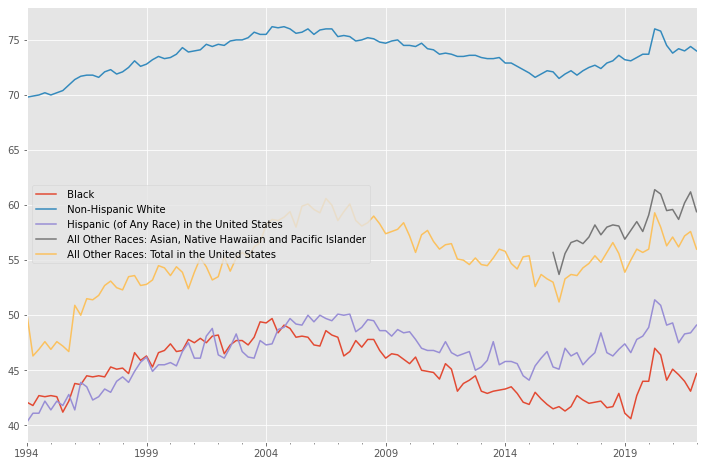

In [5]:
homeowner_race_df.plot(figsize=(12,8))

In [6]:
res = Fred_handler.search(text='Housing State', order_by='popularity')

In [7]:
res = res.loc[res['title'].str.contains('All-Transactions House Price Index for ')]
res['title'] = res['title'].str.replace('All-Transactions House Price Index for ', '')
res=res.loc[res.index.str.contains('THPI')]

In [8]:
_dict = {}
for i in res.index:
    _dict[i] = Fred_handler.get_series(i)
df_usstates_transactions = pd.concat(_dict, axis=1)

In [9]:
id_to_title = {}
for i in res.index:
    id_to_title[i] = res['title'][i]
df_usstates_transactions.columns = [id_to_title[c] for c in df_usstates_transactions.columns]

## Pull codes from web

In [10]:
abbr = pd.read_html('https://www.bls.gov/respondents/mwr/electronic-data-interchange/appendix-d-usps-state-abbreviations-and-fips-codes.htm')

In [11]:
tdf = pd.concat(abbr)
tdf.columns = tdf.iloc[0]
tdf.drop(0, inplace=True)
tdf.reset_index(inplace=True, drop=True)
tdf.drop(tdf.index[27:], inplace=True)
state_codes = pd.concat((tdf.iloc[:, 0:3], tdf.iloc[:-1, 3:]), ignore_index=True)
state_codes.index = state_codes.State
# Keeping State Double Recorded (df.index, df.column) for plotting readibility
# state_codes.drop('State', axis=1, inplace=True)

In [12]:
state_abbreviations = {}
df_usstates_transactions
df_states_recent = pd.merge(df_usstates_transactions.loc['2022-01-01'], state_codes, left_index = True, right_index=True)
df_states_recent.rename(columns={df_states_recent.columns[0]:'Most Recent'}, inplace=True)

## Plot US States by Most Recent of ALL Transaction House Price Index

In [13]:
df_states_recent.sort_values('Most Recent').tail()

,Most Recent,State,Postal Abbr.,FIPS Code
Hawaii,799.98,Hawaii,HI,15
California,868.30,California,CA,06
New York,878.48,New York,NY,36
Washington,910.83,Washington,WA,53
Massachusetts,1035.47,Massachusetts,MA,25


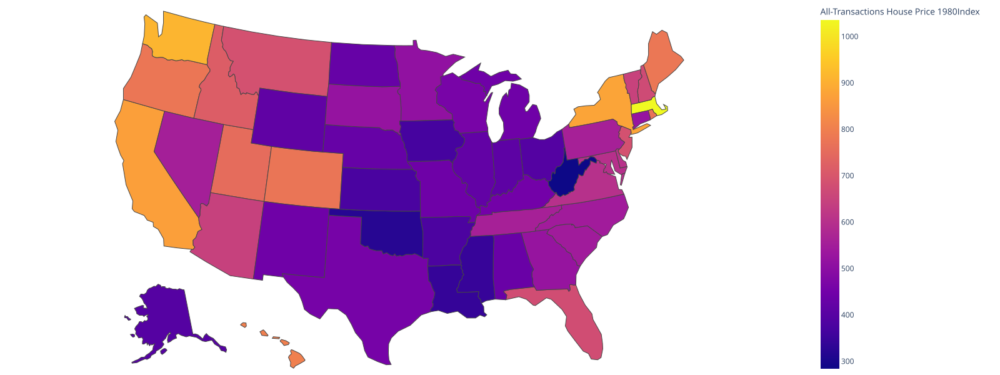

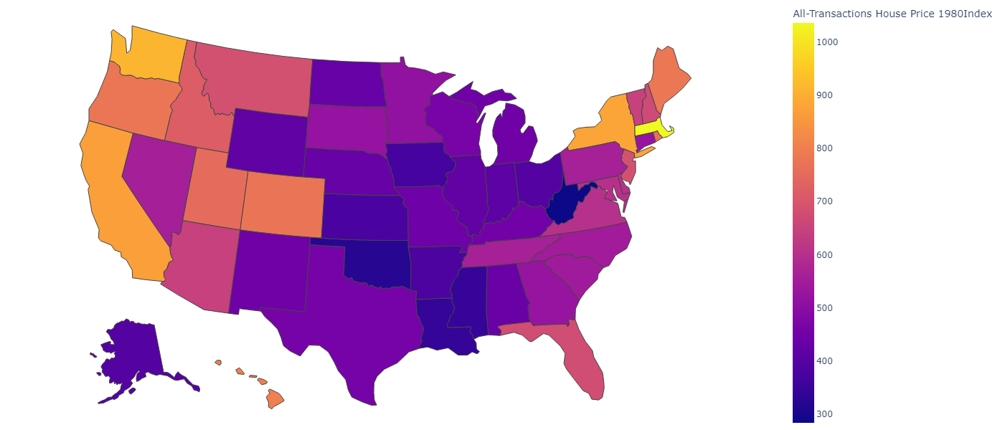

In [14]:
states_geojson = requests.get('https://raw.githubusercontent.com/nvkelso/natural-earth-vector/master/geojson/ne_110m_admin_1_states_provinces_lines.geojson').json()
geojson = px.data.election_geojson()

fig = px.choropleth(data_frame=df_states_recent,
                    locations='Postal Abbr.', locationmode='USA-states',
                    geojson=states_geojson,
                    color='Most Recent',
                    color_continuous_scale =px.colors.sequential.Plasma,
                    scope='usa',
                    hover_name='State',
                    labels={'Most Recent':'All-Transactions House Price 1980Index'},
                   )
fig.update_geos(visible=False)
fig.update_layout(height=600, width=1600, margin={'r':0,'t':0,'l':0,'b':0})
fig.show('svg')
fig.show()

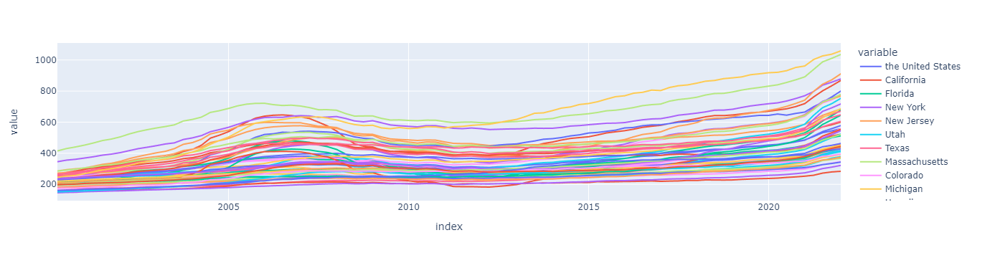

In [15]:
px.line(df_usstates_transactions[df_usstates_transactions.index > '2000'])

In [16]:
residential_by_country = Fred_handler.search('Real Residential country', order_by='popularity')

In [17]:
residential_by_country = residential_by_country.loc[residential_by_country['title'].str.contains('Real Residential Property Prices for')]
residential_by_country['title'] = residential_by_country['title'].str.replace('Real Residential Property Prices for', '')

In [18]:
residential_by_country

,id,realtime_start,realtime_end,title,observation_start,observation_end,frequency,frequency_short,units,units_short,seasonal_adjustment,seasonal_adjustment_short,last_updated,popularity,notes
series id,,,,,,,,,,,,,,,
QUSR628BIS,QUSR628BIS,2022-06-15,2022-06-15,United States,1970-01-01,2021-10-01,Quarterly,Q,Index 2010=100,Index 2010=100,Not Seasonally Adjusted,NSA,2022-03-24 11:01:08-05:00,59,Source Code: Q:US:R:628 Coverage includes all...
QKRR628BIS,QKRR628BIS,2022-06-15,2022-06-15,Republic of Korea,1975-01-01,2021-10-01,Quarterly,Q,Index 2010=100,Index 2010=100,Not Seasonally Adjusted,NSA,2022-04-28 11:02:03-05:00,45,Source Code: Q:KR:R:628 Coverage includes all...
QHKR628BIS,QHKR628BIS,2022-06-15,2022-06-15,Hong Kong SAR,1979-10-01,2021-10-01,Quarterly,Q,Index 2010=100,Index 2010=100,Not Seasonally Adjusted,NSA,2022-05-26 11:01:07-05:00,42,Source Code: Q:HK:R:628 Coverage includes all...
QDER628BIS,QDER628BIS,2022-06-15,2022-06-15,Germany,1970-01-01,2021-10-01,Quarterly,Q,Index 2010=100,Index 2010=100,Not Seasonally Adjusted,NSA,2022-04-28 11:02:03-05:00,41,Source Code: Q:DE:R:628 Coverage includes all...
QITR628BIS,QITR628BIS,2022-06-15,2022-06-15,Italy,1947-01-01,2021-10-01,Quarterly,Q,Index 2010=100,Index 2010=100,Not Seasonally Adjusted,NSA,2022-03-24 11:01:13-05:00,38,Source Code: Q:IT:R:628 Coverage includes all...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
QSKR628BIS,QSKR628BIS,2022-06-15,2022-06-15,Slovakia,2006-01-01,2021-10-01,Quarterly,Q,Index 2010=100,Index 2010=100,Not Seasonally Adjusted,NSA,2022-03-24 11:02:05-05:00,1,Source Code: Q:SK:R:628 Coverage includes all...
QLUR628BIS,QLUR628BIS,2022-06-15,2022-06-15,Luxembourg,2007-01-01,2021-10-01,Quarterly,Q,Index 2010=100,Index 2010=100,Not Seasonally Adjusted,NSA,2022-04-28 11:02:24-05:00,1,Source Code: Q:LU:R:628 Coverage includes new...
QSIR368BIS,QSIR368BIS,2022-06-15,2022-06-15,Slovenia,2008-01-01,2021-10-01,Quarterly,Q,Percent per Annum,% per Annum,Not Seasonally Adjusted,NSA,2022-04-28 11:02:55-05:00,1,Source Code: Q:SI:R:368 Coverage includes all...


In [19]:
print(residential_by_country.units.unique())
ser_annum_dict = residential_by_country[residential_by_country['units'] == 'Percent per Annum']['title'].to_dict()
ser_2010_dict = residential_by_country[residential_by_country['units'] == 'Index 2010=100']['title'].to_dict()
# country_annum_df = residential_by_country[residential_by_country['units'] == 'Percent per Annum']
# country_index_df = residential_by_country[residential_by_country['units'] == 'Index 2010=100']

['Index 2010=100' 'Percent per Annum']


In [21]:
resi_dict = {}
for country in residential_by_country.index:
    resi_dict[country] = Fred_handler.get_series(country)
resi_country_df = pd.concat(resi_dict, axis=1)

# Plotting Country Residential Propery Price 
## By Index 2010 = 100
Below we handle Residential Property Price based on Index=2010.<br>
<ul>
    <li>Figure 1: 41 Seperate charts, Red dashed line starts in Jan 2019. Early announcements of COVID</li>
    <li>Figure 2: Interactive Line plot
</ul>

In [22]:
id_to_country = residential_by_country['title'].to_dict()
country_index_df = resi_country_df.T[resi_country_df.apply(lambda x: x.name in ser_2010_dict.keys())].T
country_index_df.columns = [id_to_country[c] for c in country_index_df.columns]
country_index_df.dropna(inplace=True)

In [23]:
country_index_df.head(5)

,United States,Republic of Korea,Hong Kong SAR,Germany,Italy,Malaysia,Spain,Mexico,Singapore,Portugal,Switzerland,Turkey,Greece,South Africa,New Zealand,United Kingdom,Sweden,Netherlands,Denmark,Euro area,Hungary,Israel,Romania,Norway,Morocco,France,Austria,Lithuania,Czech Republic,Ireland,Russian Federation,Latvia,Malta,Finland,Belgium,Cyprus,Slovenia,Estonia,Croatia,Slovakia,Luxembourg
2010-01-01,102.1880,100.4909,93.4491,99.1405,99.6538,96.8586,101.3060,98.8179,95.7477,101.6862,98.3528,99.3658,106.2269,100.3992,102.4238,99.8286,98.6619,101.0185,99.1487,99.9934,102.6162,96.7733,106.3460,97.8581,99.2996,97.5619,100.2603,99.1576,100.4597,106.1877,101.6916,98.8691,101.9142,99.6381,99.2586,101.9884,101.6622,100.4538,102.0694,101.2206,101.2364
2010-04-01,101.0166,100.3644,96.7947,99.8446,99.9677,99.8799,101.2193,99.9587,99.6303,100.7250,98.3983,99.6284,100.3342,100.3799,101.1164,100.3546,99.3769,99.7261,100.3592,99.6390,100.3191,98.9260,103.9016,100.9446,101.2882,98.6505,99.5179,100.5869,100.0225,101.7947,100.5569,97.9777,100.0845,99.7295,99.1893,100.1073,100.0198,99.7083,99.6970,100.1314,98.6599
2010-07-01,99.0135,99.4961,104.0607,100.5012,100.2773,100.7967,99.6126,100.8718,101.3334,99.6735,101.1495,100.5713,98.1399,99.7025,99.4213,101.5077,100.8327,100.1242,100.9150,100.4683,99.7524,100.8582,96.6470,101.1533,100.7692,101.4767,99.7654,99.6819,99.6366,98.2918,99.5132,100.3866,103.3552,100.9364,100.7650,100.0560,99.0821,102.4940,99.2110,99.4036,99.7299
2010-10-01,97.8017,99.6599,105.6681,100.5060,100.0970,102.4224,97.9162,100.3425,103.1580,97.9585,102.1073,100.4196,95.5651,99.5307,97.1478,98.3237,101.1060,99.1442,99.5699,99.9004,97.3738,103.3273,93.5556,100.0397,98.6549,102.2866,100.4564,100.5611,99.8842,93.8251,98.3305,102.7311,94.7511,99.6978,100.7703,97.9136,99.2663,97.3936,99.0390,99.2526,100.3852
2011-01-01,95.7196,99.5045,111.9423,100.1838,98.6254,103.1552,94.4117,100.8657,103.5480,95.9450,104.8045,101.4393,95.9752,98.9766,96.6200,95.1522,101.3081,98.6900,97.4073,99.2336,95.3703,106.2646,87.7159,104.6780,99.4728,102.1835,101.9444,103.5105,98.9253,88.8522,72.6459,105.3416,96.3270,99.6476,100.0476,97.3315,104.0580,101.6175,96.9019,96.9183,98.8499


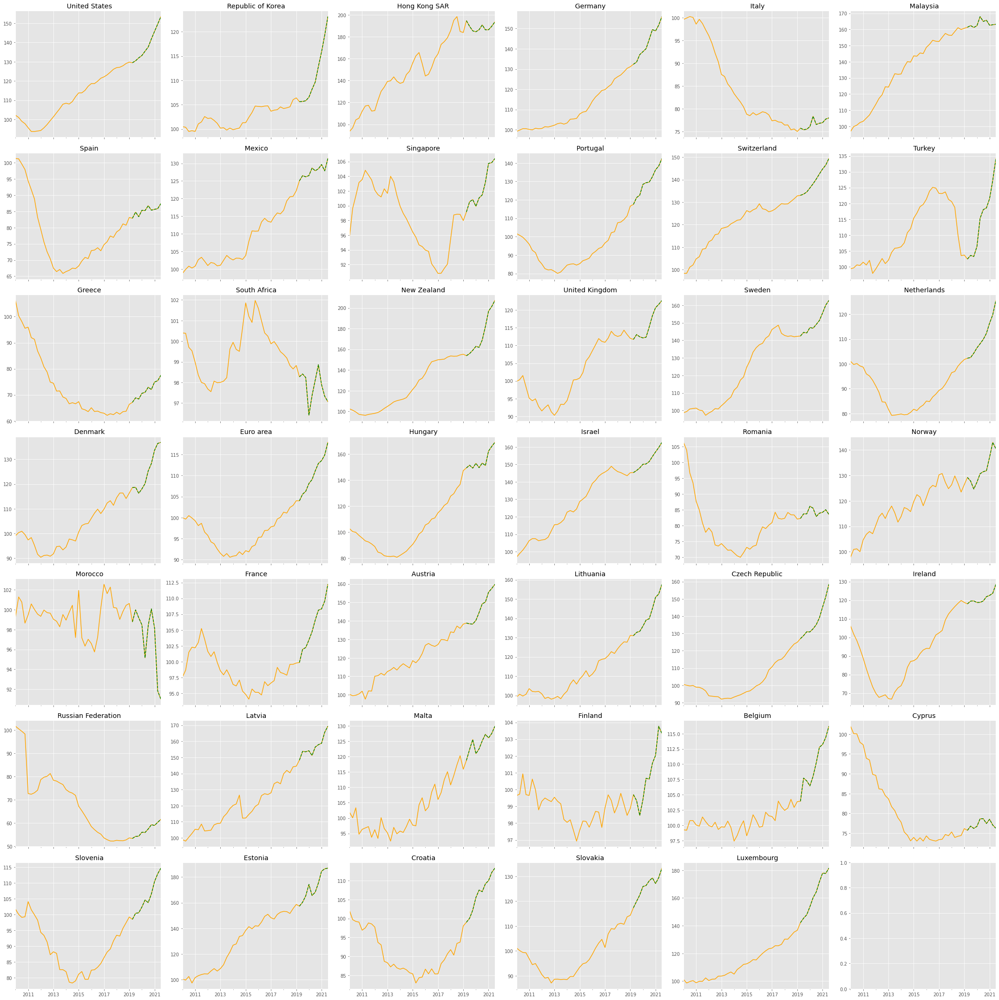

In [24]:
fig, axs = plt.subplots(7,6, figsize=(30,30), sharex=True)
axs = axs.flatten()
for idx, country in enumerate(country_index_df.columns):
    country_index_df[country].plot(ax=axs[idx], color='orange')
    country_index_df[country_index_df.index > '2019'][country].plot(ax=axs[idx], color='green', linestyle='--')
    axs[idx].set_title(country)
plt.tight_layout()
plt.show()

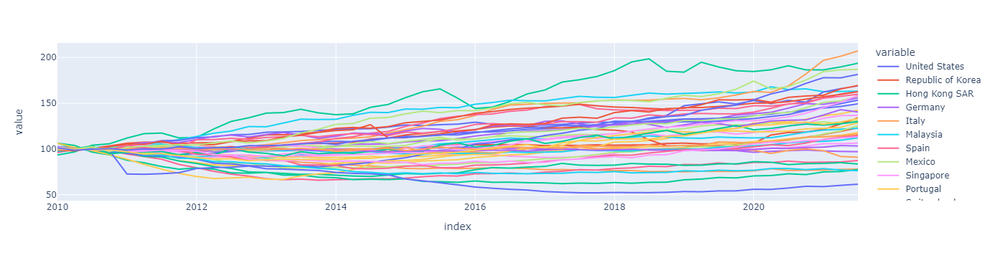

In [25]:
px.line(country_index_df)

In [26]:
country_index_df[country_index_df.index >= '2019'].T.sort_values('2021-07-01', ascending=False)

,2019-01-01,2019-04-01,2019-07-01,2019-10-01,2020-01-01,2020-04-01,2020-07-01,2020-10-01,2021-01-01,2021-04-01,2021-07-01
New Zealand,155.2219,153.7778,155.8488,159.0308,162.8244,161.8924,168.9748,181.9659,196.8574,201.3281,207.1979
Hong Kong SAR,183.9822,194.8008,189.6288,185.5009,184.6611,186.5493,190.9400,186.4041,186.4898,189.6816,193.6996
Estonia,158.6708,157.3163,160.3650,165.3539,174.2705,165.6087,168.2167,175.3265,184.5691,186.4331,186.9596
Luxembourg,136.6760,142.2081,145.4324,147.9439,153.7440,160.2235,164.3453,171.7028,177.9091,177.7344,181.5434
Latvia,144.5069,148.3204,153.7351,153.5184,154.1509,151.1813,156.4186,157.9013,158.7723,165.6265,169.3839
Hungary,147.2772,149.3897,151.4380,149.1813,152.9059,149.5233,153.1086,151.1723,162.3236,165.8970,169.0227
Malaysia,160.7118,161.3558,162.3719,161.2281,162.2680,167.9340,164.9565,165.7071,162.6052,162.8951,163.1997
Sweden,142.2722,142.4407,144.5396,144.2060,147.2870,146.9059,149.0590,151.3285,155.5506,160.0747,162.7346
Israel,145.2187,145.2854,146.4844,147.9621,150.0777,150.2192,151.6167,154.4850,157.1338,159.6316,162.5967
Austria,138.2774,138.8192,138.4272,138.2961,140.2961,144.5096,149.2772,150.1789,155.5303,157.5435,159.8206


## By Country Percent per Annum

In [27]:
country_annum_df = resi_country_df.T[resi_country_df.apply(lambda x: x.name in ser_annum_dict.keys())].T
country_annum_df.columns = [id_to_country[c] for c in country_annum_df.columns]
country_annum_df.dropna(inplace=True)

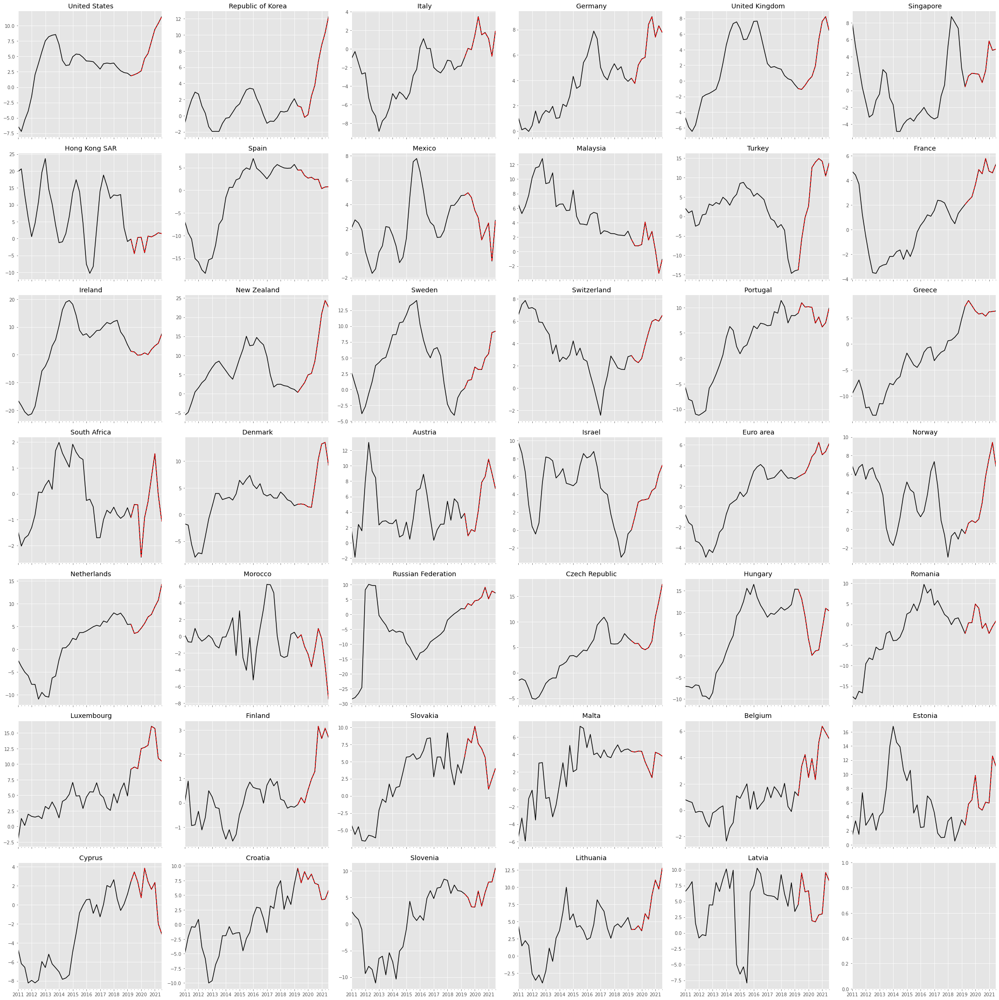

In [28]:
fig, axs = plt.subplots(7,6, figsize=(30,30), sharex=True)
axs = axs.flatten()
for idx, country in enumerate(country_annum_df.columns):
    country_annum_df[country].plot(ax=axs[idx], color='black')
    country_annum_df[country_annum_df.index > '2019'][country].plot(ax=axs[idx], color='red', linestyle='--')
    axs[idx].set_title(country)
plt.tight_layout()
plt.show()

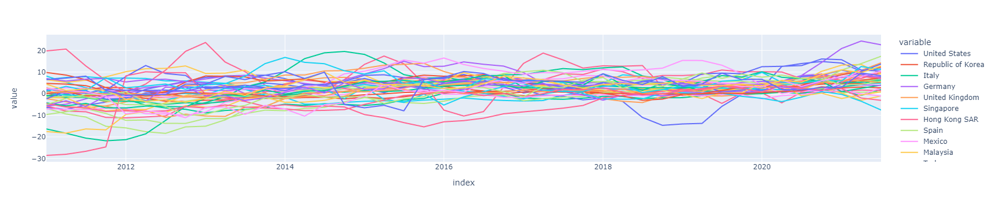

In [29]:
px.line(country_annum_df)

## Combined Index=2010 && Percent per Annum

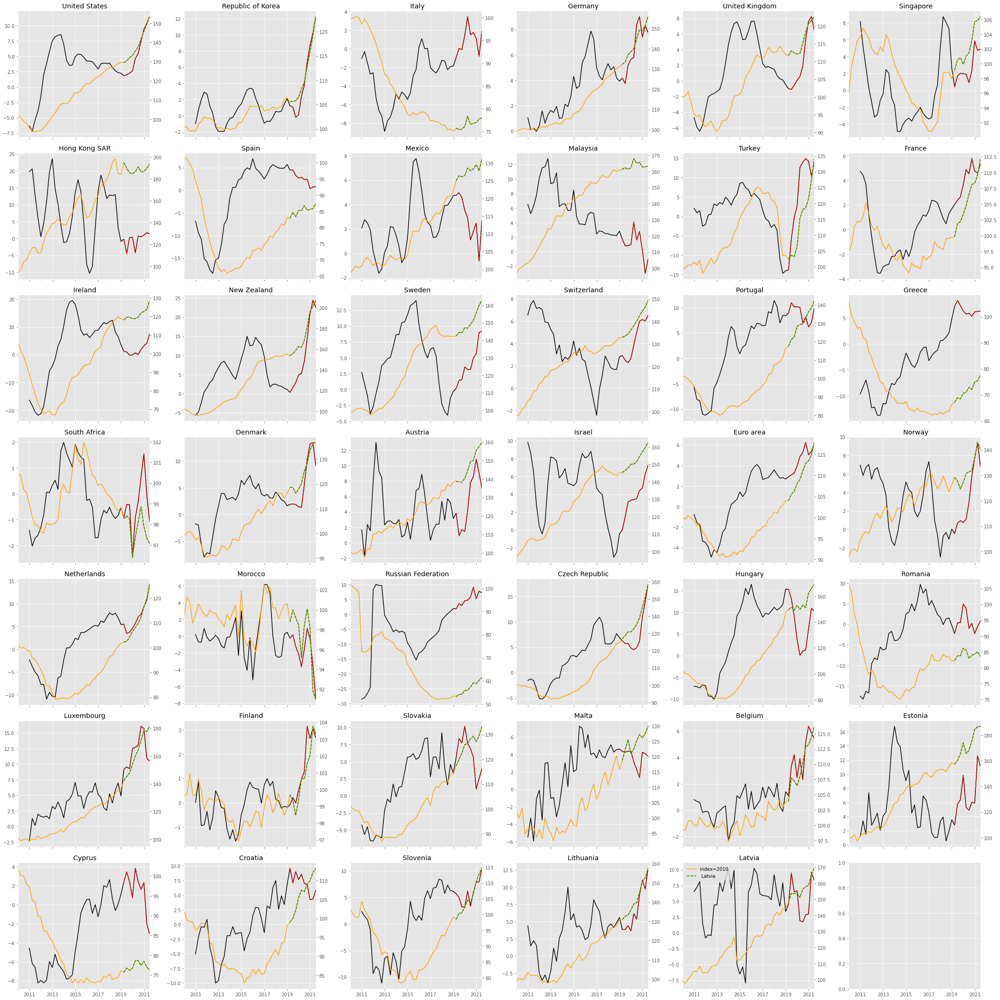

In [30]:
fig, axs = plt.subplots(7,6, figsize=(30,30), sharex=True)
axs = axs.flatten()
for idx, country in enumerate(country_annum_df.columns):
    ax2 = axs[idx].twinx()    
    country_annum_df[country].plot(ax=axs[idx], color='black', label='Per Annum')
    country_annum_df[country_annum_df.index > '2019'][country].plot(ax=axs[idx], color='red', linestyle='--')
    country_index_df[country].plot(ax=ax2, color='orange', label='index=2010')
    country_index_df[country_index_df.index > '2019'][country].plot(ax=ax2, color='green', linestyle='--')
    axs[idx].set_title(country)
    ax2.grid(False)
plt.tight_layout()
plt.legend()
plt.show()

# Geographic Choropleth Mappings
## Index=2010

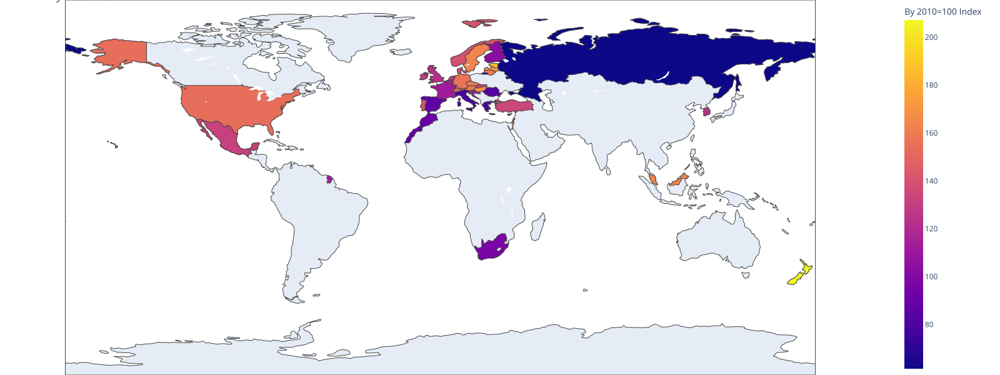

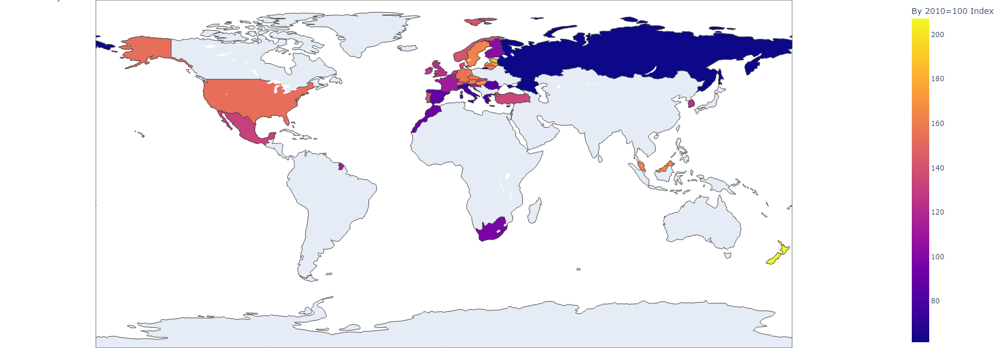

In [32]:
states_geojson = requests.get('https://raw.githubusercontent.com/nvkelso/natural-earth-vector/master/geojson/ne_110m_admin_1_states_provinces_lines.geojson').json()
# countries_geojson = 
geojson = px.data.election_geojson()

fig = px.choropleth(data_frame=country_index_df.T,
                    locations=country_index_df.T.index, locationmode='country names',
                    color='2021-07-01',
                    color_continuous_scale =px.colors.sequential.Plasma, hover_name=country_index_df.T.index,
                    labels={'2021-07-01':'By 2010=100 Index'},
                    title=' by 2010 Index'
                   )
fig.update_layout(height=600, width=1600, margin={'r':0,'t':0,'l':0,'b':0})
fig.show('svg')
fig.show()

## By Country Percent Per Annum

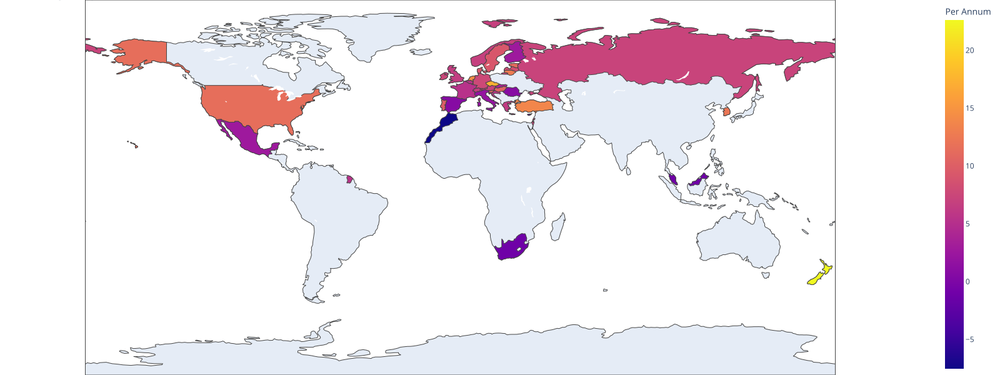

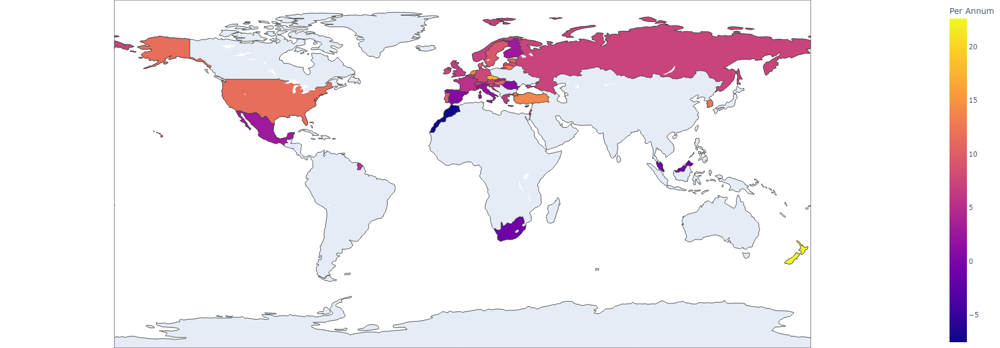

In [33]:
states_geojson = requests.get('https://raw.githubusercontent.com/nvkelso/natural-earth-vector/master/geojson/ne_110m_admin_1_states_provinces_lines.geojson').json()
# countries_geojson = 
geojson = px.data.election_geojson()

fig = px.choropleth(data_frame=country_annum_df.T,
                    locations=country_annum_df.T.index, locationmode='country names',
                    color='2021-07-01',
                    color_continuous_scale =px.colors.sequential.Plasma, hover_name=country_annum_df.T.index,
                    labels={'2021-07-01':'Per Annum'},
                    title='Per Annum'
                   )

fig.update_layout(height=600, width=1600, margin={'r':0,'t':0,'l':0,'b':0})
fig.show('svg')
fig.show()

# Purchasing Power Parity - OECD
FRED's PPP data is outdated/incomplete so we'll be using OECD Data

In [35]:
df_ppp = pd.read_csv('OECD-PPP-2000-2021.csv')
df_ppp = df_ppp[['LOCATION', 'TIME', 'Value']]
df_ppp = df_ppp[df_ppp['TIME'] == 2021]

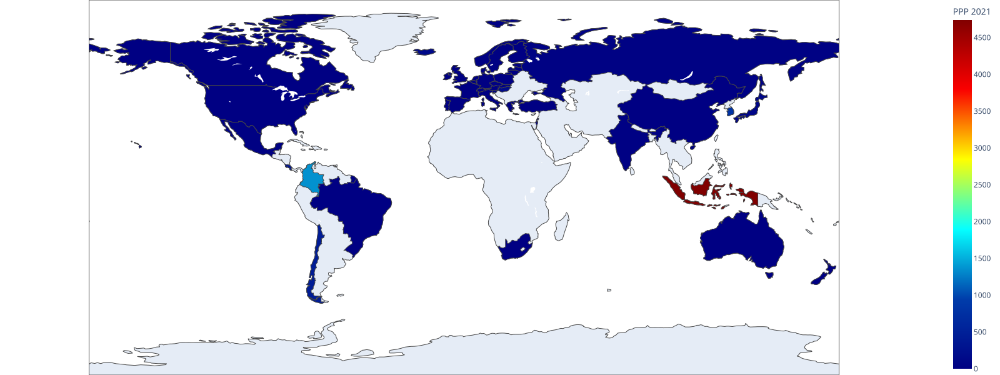

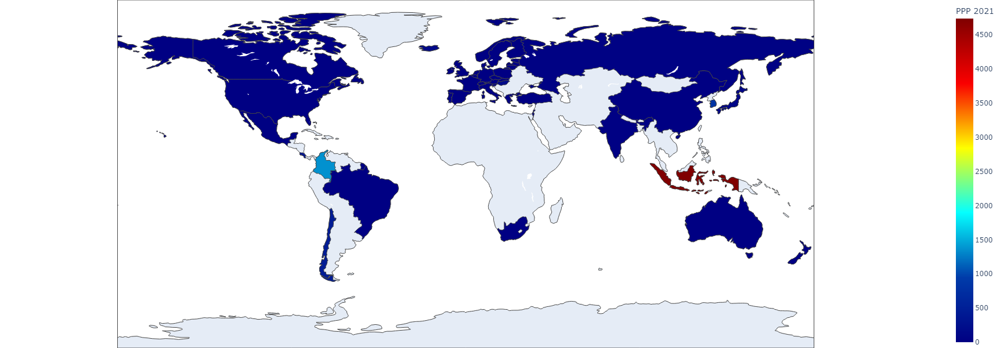

In [36]:
states_geojson = requests.get('https://raw.githubusercontent.com/nvkelso/natural-earth-vector/master/geojson/ne_110m_admin_1_states_provinces_lines.geojson').json()
fig = px.choropleth(data_frame=df_ppp,
                    locations=df_ppp.LOCATION, locationmode='ISO-3', 
                    color='Value',
                    labels={'Value':'PPP 2021'},
                    color_continuous_scale =px.colors.sequential.Jet,
                    title='PPP'
                   )

fig.update_layout(height=600, width=1600, margin={'r':0,'t':0,'l':0,'b':0})
fig.show('svg')
fig.show()

{'whiskers': [<matplotlib.lines.Line2D at 0x1eb5d769ae0>,
 'caps': [<matplotlib.lines.Line2D at 0x1eb5d76a080>,
 'boxes': [<matplotlib.lines.Line2D at 0x1eb5d768700>],
 'medians': [<matplotlib.lines.Line2D at 0x1eb5d76a620>],
 'fliers': [<matplotlib.lines.Line2D at 0x1eb5d76a8f0>],
 'means': []}

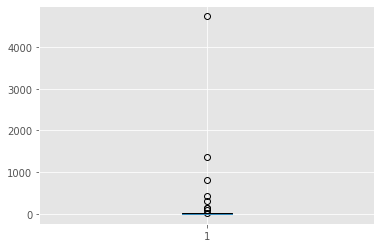

In [37]:
plt.boxplot(df_ppp.Value)

## Staggering Colormap by Quartiles
<ul>
    <li>Identify Quartiles</li>
    <li>Disect Sequential Colormap into 3 seperate Sequential Colormaps</li>
    <li>Plot each Quartile</li>
    <li>Combine into one choropleth</li>
    <li>Review and Adjust for mo
    
</ul>

In [38]:
df_ppp.sort_values('Value').count()

LOCATION    46
TIME        46
Value       46
dtype: int64

In [39]:
q3, q1 = np.percentile(df_ppp['Value'], [75, 25])
iqr = q3 - q1

In [40]:
print('<Q1')
print(q1)
print(df_ppp[df_ppp['Value'] < q1].count())
print('\nIQR')
print(df_ppp[df_ppp['Value'] < q3][df_ppp['Value'] > q1].count())
print('\n>Q3')
print(q3)
print(df_ppp[df_ppp['Value'] > q3].count())

<Q1
0.69588775
LOCATION    12
TIME        12
Value       12
dtype: int64

IQR
LOCATION    22
TIME        22
Value       22
dtype: int64

>Q3
10.87199575
LOCATION    12
TIME        12
Value       12
dtype: int64


C:\Users\Charles\AppData\Local\Temp\ipykernel_7592\2753806440.py:5: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



In [41]:
px.colors.sequential.Jet

['rgb(0,0,131)',
 'rgb(0,60,170)',
 'rgb(5,255,255)',
 'rgb(255,255,0)',
 'rgb(250,0,0)',
 'rgb(128,0,0)']

In [42]:
colorq1 = ['rgb(0,0,131)','rgb(0,60,170)']
coloriqr = ['rgb(0,60,170)','rgb(5,255,255)','rgb(255,255,0)','rgb(250,0,0)']
colorq3 = ['rgb(250,0,0)','rgb(128,0,0)']

In [43]:
q1mask = df_ppp[df_ppp['Value'] < q1]
iqrmask = df_ppp[df_ppp['Value'] < q3][df_ppp['Value'] > q1]
q3mask = df_ppp[df_ppp['Value'] > q3]

C:\Users\Charles\AppData\Local\Temp\ipykernel_7592\209257734.py:2: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



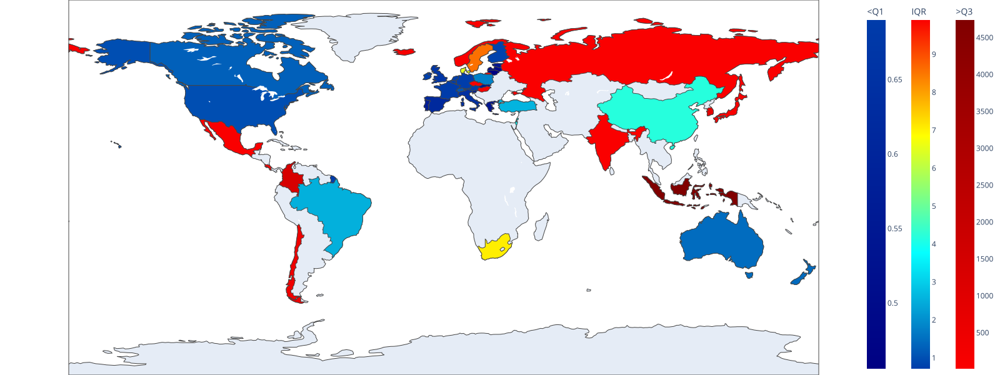

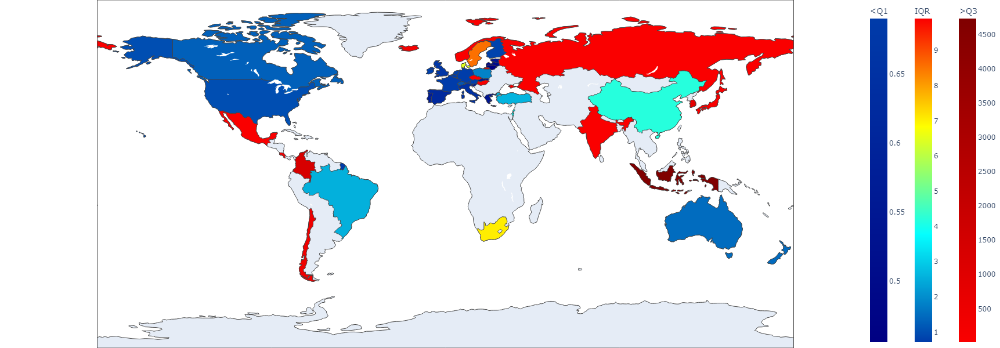

In [46]:
states_geojson = requests.get('https://raw.githubusercontent.com/nvkelso/natural-earth-vector/master/geojson/ne_110m_admin_1_states_provinces_lines.geojson').json()
fig = px.choropleth(data_frame=q1mask,
                    locations=q1mask.LOCATION, locationmode='ISO-3', 
                    color='Value',
                    labels={'Value':'<Q1'},
                    color_continuous_scale =colorq1,
                    title='PPP',
                    basemap_visible=True,
                   )
fig2 = px.choropleth(data_frame=iqrmask,
                    locations=iqrmask.LOCATION, locationmode='ISO-3', 
                    color=iqrmask.Value,
                    labels={'Value':'IQR'},
                    color_continuous_scale =coloriqr,
                    title='PPP',
                    basemap_visible=True,
                   )
fig3 = px.choropleth(data_frame=q3mask,
                    locations=q3mask.LOCATION, locationmode='ISO-3', 
                    color=q3mask.Value,
                    labels={'Value':'>Q3'},
                    color_continuous_scale = colorq3,
                    title='PPP',
                   )
# First we add the trace of the data to fig. This stores it to the Fig dictionary under fig['data'][idx] where idx is list of figs.
fig.add_trace(fig2.data[0])
# We access the layout to create another coloraxis based on coloraxis in fig2
fig.layout.coloraxis2 = fig2.layout.coloraxis
# We step through fig.__dict__ to the coloraxis of fig['data'] at position 1 and set it equal to the layout.coloraxis2 we created
fig['data'][1]['coloraxis'] = 'coloraxis2'

fig.add_trace(fig3.data[0])
fig.layout.coloraxis3 = fig3.layout.coloraxis
fig['data'][2]['coloraxis'] = 'coloraxis3'

# Adjusting coloraxis bar so all are visible
fig.layout.coloraxis.colorbar.x = +.97
fig.layout.coloraxis2.colorbar.x = +1.02
fig.layout.coloraxis3.colorbar.x = +1.07

fig.update_layout(height=600, width=1600, margin={'r':0,'t':0,'l':0,'b':0})
fig.show('svg')
fig.show()

# FRED Exploration

In [47]:
_dict = {}
for seri in res.index:
    _dict[seri] = Fred_handler.get_series(seri)
ppp_df = pd.concat(_dict, axis=1)
ppp_df.dropna(inplace=True)
id_to_country = res['title'].str.replace('Purchasing Power Parity, Share of World for ', '').to_dict()

In [48]:
ppp_df.columns = [id_to_country[c] for c in ppp_df.columns]
ppp_df[ppp_df.index > '2019'].T

,2019-04-01,2019-07-01,2019-10-01,2020-01-01,2020-04-01,2020-07-01,2020-10-01,2021-01-01,2021-04-01,2021-07-01,2021-10-01,2022-01-01
the United States,435.84,441.37,445.30,450.42,454.83,462.80,473.02,484.29,511.22,539.60,557.93,578.04
California,653.06,659.93,664.20,670.42,678.09,686.04,700.15,719.59,762.33,801.62,834.09,868.30
Florida,465.46,473.12,479.25,486.35,492.48,501.04,514.52,531.04,565.29,607.29,641.32,676.58
New York,694.33,704.49,711.90,718.79,724.34,736.15,752.19,770.26,797.48,838.06,857.02,878.48
New Jersey,528.92,536.92,540.60,545.25,550.64,560.21,572.08,586.06,614.01,644.11,664.58,685.23
Utah,500.48,508.61,516.04,522.86,532.30,545.13,564.19,587.06,644.19,693.36,718.84,753.20
Texas,339.41,343.38,345.91,349.60,352.00,357.44,365.71,374.29,396.31,421.49,439.06,458.99
Massachusetts,806.47,815.83,823.39,832.01,840.52,855.50,872.57,891.48,939.29,988.02,1010.73,1035.47
Colorado,575.38,580.60,585.48,591.84,598.79,608.16,620.64,637.31,683.31,723.63,743.50,774.70
Michigan,345.75,349.98,352.42,355.76,359.49,367.32,374.96,382.83,404.36,425.01,434.26,445.61


In [49]:
Fred_handler.get_series('PPPTTLMXA618NUPN')

1950-01-01    0.003234
1951-01-01    0.003681
1952-01-01    0.003899
1953-01-01    0.003940
1954-01-01    0.004251
                ...   
2006-01-01    7.646234
2007-01-01    7.819646
2008-01-01    8.012788
2009-01-01    8.405204
2010-01-01    8.635244
Length: 61, dtype: float64

In [50]:
Fred_handler.search('Japan exchange', order_by='popularity')

,id,realtime_start,realtime_end,title,observation_start,observation_end,frequency,frequency_short,units,units_short,seasonal_adjustment,seasonal_adjustment_short,last_updated,popularity,notes
series id,,,,,,,,,,,,,,,
DEXJPUS,DEXJPUS,2022-06-15,2022-06-15,Japanese Yen to U.S. Dollar Spot Exchange Rate,1971-01-04,2022-06-10,Daily,D,Japanese Yen to One U.S. Dollar,Japanese Yen to 1 U.S. $,Not Seasonally Adjusted,NSA,2022-06-13 15:20:06-05:00,65,Noon buying rates in New York City for cable t...
EXJPUS,EXJPUS,2022-06-15,2022-06-15,Japanese Yen to U.S. Dollar Spot Exchange Rate,1971-01-01,2022-05-01,Monthly,M,Japanese Yen to One U.S. Dollar,Japanese Yen to 1 U.S. $,Not Seasonally Adjusted,NSA,2022-06-06 15:19:06-05:00,57,Averages of daily figures. Noon buying rates i...
NIKKEI225,NIKKEI225,2022-06-15,2022-06-15,"Nikkei Stock Average, Nikkei 225",1949-05-16,2022-06-15,"Daily, Close",D,Index,Index,Not Seasonally Adjusted,NSA,2022-06-15 07:02:04-05:00,56,"The observations for the Nikkei Stock Average,..."
TWEXB,TWEXB,2022-06-15,2022-06-15,"Trade Weighted U.S. Dollar Index: Broad, Goods...",1995-01-04,2020-01-01,"Weekly, Ending Wednesday",W,Index Jan 1997=100,Index Jan 1997=100,Not Seasonally Adjusted,NSA,2020-01-06 15:49:01-06:00,53,Averages of daily figures. A weighted average ...
DTWEXM,DTWEXM,2022-06-15,2022-06-15,Nominal Major Currencies U.S. Dollar Index (Go...,1973-01-02,2019-12-31,Daily,D,Index Mar 1973=100,Index Mar 1973=100,Not Seasonally Adjusted,NSA,2020-01-06 15:49:01-06:00,51,A weighted average of the foreign exchange val...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
DSAMRIFCERJP,DSAMRIFCERJP,2022-06-15,2022-06-15,Exchange Rate Adjusted Changes of Domestic Deb...,1998-01-01,2021-10-01,Quarterly,Q,Millions of US Dollars,Mil. of US $,Not Seasonally Adjusted,NSA,2022-06-13 15:25:16-05:00,1,This series appears in Table 16a. Source Code:...
PLOGINJPA623NUPN,PLOGINJPA623NUPN,2022-06-15,2022-06-15,Price Level of Government Consumption for Japan,1950-01-01,2010-01-01,Annual,A,PPP of Government Consumption over Exchange Rate,PPP of Government Consumption over Exchange Rate,Not Seasonally Adjusted,NSA,2012-09-17 09:52:01-05:00,1,Price Level of GDP is the PPP over GDP divided...
M0538BUSM533NNBR,M0538BUSM533NNBR,2022-06-15,2022-06-15,"Raw Silk, Total Visible Stocks for United States",1930-07-01,1941-06-01,"Monthly, End of Month",M,Thousands of Bales (Of 132.25 Lbs. Approximately),Thous. Of Bales (Of 132.25 Lbs. Approximately),Not Seasonally Adjusted,NSA,2012-08-17 10:49:22-05:00,1,Series Is Presented Here As Two Variables--(1)...


In [51]:
jpn_yen = ['DEXJPUS', 'EXJPUS']

In [52]:
currency = {}
for i in jpn_yen:
    currency[i] = Fred_handler.get_series(i)

In [53]:
yen_df = pd.concat(currency, axis=1)

In [54]:
yen_df.dropna()

,DEXJPUS,EXJPUS
1971-02-01,357.67,357.5450
1971-03-01,357.63,357.5187
1971-04-01,357.49,357.5032
1971-06-01,357.46,357.4118
1971-07-01,357.40,357.4043
...,...,...
2021-11-01,114.19,113.9650
2021-12-01,112.82,113.8329
2022-02-01,114.77,115.2763
2022-03-01,114.87,118.5774


## Searching average wage